In [ ]:
!pip install matplotlib==3.3.1
!pip install tensorflow==2.4.1    

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import pickle
from PIL import Image
from google.colab.patches import cv2_imshow

In [ ]:
from tensorflow.keras.layers import Conv3D, ConvLSTM2D, Conv3DTranspose
from tensorflow.keras.models import Sequential

In [ ]:
"""Execute only when running in google colab"""

from google.colab import drive
drive.mount("/content/gdrive")

In [ ]:
accident_videos = '/accident_videos'
accident_frames = '/accident_frames'
non_accident_videos = '/non_accident_videos'
non_accident_frames = '/non_accident_frames'
dataset_path = 'gdrive/MyDrive/accident_detection_autoencoders'
path = dataset_path + non_accident_frames
accident_video_path = dataset_path + accident_videos
#non_accident_video_path = dataset_path + non_accident_videos

In [ ]:
train_videos = os.listdir(accident_video_path)

In [ ]:
train_videos

['0.mp4', '629.mp4', '952.mp4']

In [ ]:
video = input("Enter video name : ")
video_name = video.split('.')[0]
extension = video.split('.')[1]

In [ ]:
def framify(video_name,extension):
  """
  Saves all the frames in a video.

  This function reads all the frames in `video_name` 
  and then writes them at location `dataset/accident_frames`
  inside a folder named as `video_name`.

  Each frame will be saved as frame(frame position).jpg.

  Arguments:
  ----------
    video_name: The name of the video without any extensions.
    extension: Format of the video. 

  Returns:
  ----------
    None.
  
  """
  path = dataset_path + accident_frames + '/' + video_name
  vid = cv2.VideoCapture(accident_video_path + '/' + video_name + '.' + extension)
  count = 0
  success = 1
  if os.path.exists(path):
    print("path already exists")
    pass
  else:
    os.makedirs(path)
    while success:
      success, frame = vid.read()
      if success == False:
        break
      cv2.imwrite(dataset_path + accident_frames + '/' + video_name + '/frame%d.jpg' % count, frame)
      print('Read a new frame for video : ',video_name,success )
      count += 1

In [ ]:
framify(video_name,extension)

Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for video :  629 True
Read a new frame for vide

In [ ]:
def store_inarray(frame_path,folder_name):
  """
  Saves image matrices in a list.

  This function initializes an empty list
  and appends the image arrays in that list.

  Arguments:
  ----------
    frame_path: Path to the folder where image folders are saved.
    folder_name: Folder containing all the frames in a video.

  Returns:
  ----------
    List

  Raises:
  ----------
    FileNotFoundError: In case of path does not exist.

  """
  store_image=[]
  frame_list = os.listdir(frame_path + '/' + folder_name)
  for frame in frame_list:
    image = Image.open(frame_path + '/' + folder_name + '/' + frame).resize((227,227))
    image=np.array(image, dtype = np.float32) / 256.0
    store_image.append(image[:,:,0])
  return store_image

In [ ]:
store_image = store_inarray(dataset_path + non_accident_frames,video_name)

In [ ]:
store_image = np.array(store_image)

In [ ]:
a,b,c = store_image.shape

In [ ]:
store_image = store_image.reshape(b,c,a)

In [ ]:
store_image.shape

(227, 227, 40)

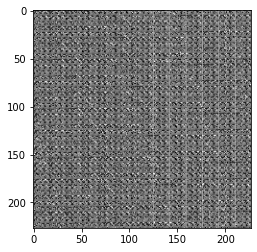

In [ ]:
plt.imshow(store_image[:,:,0],cmap = 'gray')

In [ ]:
store_image.shape

(227, 227, 40)

In [ ]:
pkl_file = '/content/gdrive/MyDrive/accident_detection_autoencoders/store_image.pkl'
if os.path.exists(pkl_file):
  os.remove(pkl_file)
with open(pkl_file,'wb') as f:
  pickle.dump(store_image,f)

In [ ]:
store_img = pickle.load(open('/content/gdrive/MyDrive/accident_detection_autoencoders/store_image.pkl','rb'))

In [ ]:
store_img.shape

(227, 227, 40)

In [ ]:
model = Sequential([                                   
      tf.keras.layers.Conv3D(filters = 128,kernel_size = (11,11,1),strides = (4,4,1), padding='valid',input_shape = (227,227,10,1),activation='tanh'),
      tf.keras.layers.Conv3D(filters = 64, kernel_size = (5,5,1), strides = (2,2,1), padding='valid', activation='tanh'),
      tf.keras.layers.ConvLSTM2D(filters=64, kernel_size=(3,3), strides = 1, padding = 'same', dropout=0.4, recurrent_dropout=0.3, return_sequences = True),
      tf.keras.layers.ConvLSTM2D(filters=32,kernel_size=(3,3), strides=1,padding='same',dropout=0.3,return_sequences=True),
      tf.keras.layers.ConvLSTM2D(filters = 64, kernel_size=(3,3),strides = 1,return_sequences = True,padding='same',dropout=0.5),
      tf.keras.layers.Conv3DTranspose(filters = 128,kernel_size=(5,5,1),strides=(2,2,1),padding = 'valid',activation = 'tanh'),
      tf.keras.layers.Conv3DTranspose(filters = 1,kernel_size = (11,11,1),strides = (4,4,1),padding = 'valid',activation = 'tanh')
])

model.compile(optimizer='adam', loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d (Conv3D)              (None, 55, 55, 10, 128)   15616     
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 26, 26, 10, 64)    204864    
_________________________________________________________________
conv_lst_m2d (ConvLSTM2D)    (None, 26, 26, 10, 64)    295168    
_________________________________________________________________
conv_lst_m2d_1 (ConvLSTM2D)  (None, 26, 26, 10, 32)    110720    
_________________________________________________________________
conv_lst_m2d_2 (ConvLSTM2D)  (None, 26, 26, 10, 64)    221440    
_________________________________________________________________
conv3d_transpose (Conv3DTran (None, 55, 55, 10, 128)   204928    
_________________________________________________________________
conv3d_transpose_1 (Conv3DTr (None, 227, 227, 10, 1)   1

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
frames=store_img.shape[2]
frames=frames-frames%10
store_img=store_img[:,:,:frames]
print(store_img.shape)
store_img=store_img.reshape(-1,227,227,10)
store_img=np.expand_dims(store_img,axis=4)
target_data=store_img.copy()

(227, 227, 40)


In [ ]:
print(store_img.shape)

(4, 227, 227, 10, 1)


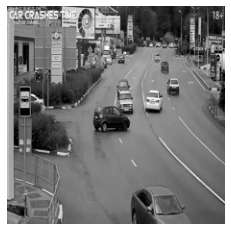

In [ ]:
plt.axis('off')
plt.imshow(store_img.reshape(-1,10,227,227,1)[0,0,:,:,0],cmap = 'gray')

In [ ]:
batch_size=1
epochs=1000
model.fit(store_img,target_data, batch_size=batch_size, epochs=epochs)
model.save('/content/gdrive/MyDrive/accident_detection_autoencoders/saved_model.h5')

Epoch 1/1000
4/4 [==============================] - 9s 282ms/step - loss: 0.1924 - accuracy: 0.0041
Epoch 2/1000
4/4 [==============================] - 1s 271ms/step - loss: 0.0908 - accuracy: 0.0022
Epoch 3/1000
4/4 [==============================] - 1s 282ms/step - loss: 0.0618 - accuracy: 0.0035
Epoch 4/1000
4/4 [==============================] - 1s 271ms/step - loss: 0.0533 - accuracy: 0.0026
Epoch 5/1000
4/4 [==============================] - 1s 270ms/step - loss: 0.0502 - accuracy: 0.0042
Epoch 6/1000
4/4 [==============================] - 1s 272ms/step - loss: 0.0472 - accuracy: 0.0023
Epoch 7/1000
4/4 [==============================] - 1s 282ms/step - loss: 0.0442 - accuracy: 0.0041
Epoch 8/1000
4/4 [==============================] - 1s 278ms/step - loss: 0.0425 - accuracy: 0.0039
Epoch 9/1000
4/4 [==============================] - 1s 274ms/step - loss: 0.0414 - accuracy: 0.0037
Epoch 10/1000
4/4 [==============================] - 1s 278ms/step - loss: 0.0398 - accuracy: 0.0041

In [ ]:
model=tf.keras.models.load_model('/content/gdrive/MyDrive/accident_detection_autoencoders/saved_model.h5')

In [ ]:
def mean_squared_loss(x1,x2):
  """
  Calculates mean squared error.

  This function calculates mean squared 
  difference of values in two different arrays.

  Arguments:
  ----------
    x1: First Numpy array.
    x2: Second Numpy array.

  Returns:
  ----------
    float64.
  """
  difference=x1-x2
  if difference.ndim == 5:
    a,b,c,d,e=difference.shape
    n_samples=a*b*c*d*e
  else:
    a,b = difference.shape
    n_samples=a*b
  sq_difference=difference**2
  Sum=sq_difference.sum()
  distance=np.sqrt(Sum)
  mean_distance=distance/n_samples

  return mean_distance

In [ ]:
store_img = store_inarray(dataset_path + accident_frames,video_name)

In [ ]:
store_img = np.array(store_img)

In [ ]:
store_img.shape

(160, 227, 227)

In [ ]:
a,b,c = store_img.shape
store_img = store_img.reshape(b,c,a)

In [ ]:
store_img.shape

(227, 227, 160)

In [ ]:
frames=store_img.shape[2]
frames=frames-frames%10
store_img=store_img[:,:,:frames]
print(store_img.shape)
store_img=store_img.reshape(-1,227,227,10)
store_img=np.expand_dims(store_img,axis=4)
imagedump = store_img
output=model.predict(imagedump)
loss=mean_squared_loss(imagedump,output)
print(loss)

(227, 227, 160)
3.631466834058249e-05


In [ ]:
imagedump.shape

(16, 227, 227, 10, 1)

In [ ]:
store_img.shape

(16, 227, 227, 10, 1)

In [ ]:
InPut = imagedump.reshape(-1,10,227,227,1)

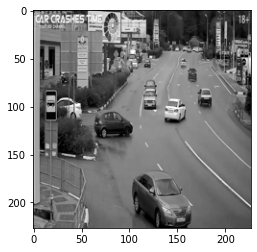

In [ ]:
plt.imshow(InPut[0,0,:,:,0],cmap = 'gray')

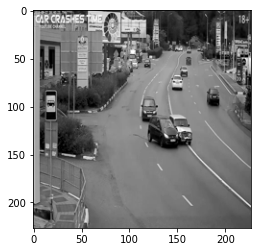

In [ ]:
plt.imshow(InPut[9,6,:,:,0],cmap = 'gray')

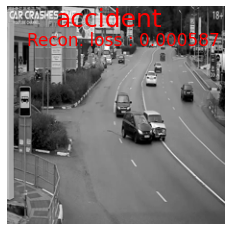

In [ ]:
result_path = '/content/gdrive/MyDrive/accident_detection_autoencoders/result_0'
if os.path.exists(result_path):
  shutil.rmtree(result_path)
os.makedirs(result_path)
image = InPut[9,6,:,:,0]
plt.imshow(image,cmap = 'gray')
plt.axis('off')
plt.text(50,20,'accident',fontsize = 25,c = 'r')
plt.text(20,40,'Recon. loss : 0.000587',fontsize = 17,c = 'r')
plt.savefig(result_path + '/' + 'frame%d.jpg' % 0)

In [ ]:
output.shape

(16, 227, 227, 10, 1)

In [ ]:
output = output.reshape(-1,10,227,227,1)

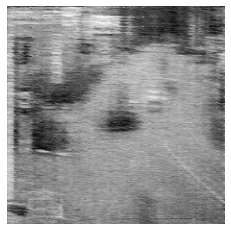

In [ ]:
plt.axis('off')
plt.imshow(output[0,0,:,:,0],cmap = 'gray')

In [ ]:
mean_squared_loss(InPut[6,4,:,:,0],output[6,4,:,:,0])

0.0004429738635258407

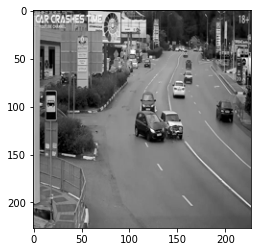

In [ ]:
plt.imshow(InPut[6,4,:,:,0],cmap = 'gray')

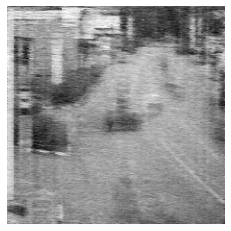

In [ ]:
plt.axis('off')
plt.imshow(output[0,1,:,:,0],cmap = 'gray')

In [ ]:
output[0,9,:,:,0].shape

(227, 227)

In [ ]:
def writing_result(original,generated,folder_name,threshold):
  """
  Saves the frames with reconstruction loss written on them.

  This function compares the input and output frames, then writes
  the value of recontruction loss on each frame of input in comparison 
  to the corresponding frames given by the model as output, writes `accident`
  whenever condition satisfies and then saves these images/frames.

  Arguments:
  -----------
    original: Numpy array for input images.
    generated: Numpy array for output images.
    folder_name: Folder in which the frames will be written.
    threshold: Value for reconstruction loss beyond which 
          frames will have `accident` written on them.

  Returns:
  ----------
    None.
  """
  result_path = '/content/gdrive/MyDrive/accident_detection_autoencoders/result/' + folder_name
  if os.path.exists(result_path):
    shutil.rmtree(result_path)
    os.makedirs(result_path)
  else:
    os.makedirs(result_path)
  for i in range(original.shape[0]):
    for j in range(original.shape[1]):
      count = i*10 + j
      frame = original[i,j,:,:,0]
      gen_frame = generated[i,j,:,:,0]
      loss = mean_squared_loss(original[i,j,:,:,0],generated[i,j,:,:,0])
      if loss >= threshold:
        fig = plt.figure()
        image = frame 
        plt.imshow(image,cmap = 'gray')
        plt.axis('off')
        plt.text(50,20,'accident',fontsize = 25,c = 'r')
        plt.text(20,40,'Recon. loss : %0.5f' % loss,fontsize = 17,c = 'r')
        plt.savefig(result_path + '/' + 'frame%d.jpg' % count)
        print("writing frame : %d" % count)
      else:
        fig = plt.figure()
        image = frame
        plt.imshow(image,cmap = 'gray')
        plt.axis('off')
        plt.text(20,40,'Recon. loss : %0.5f' % loss,fontsize = 17,c = 'r')
        plt.savefig(result_path + '/' + 'frame%d.jpg' % count)
        print("writing frame : %d" % count)

In [ ]:
loss_threshold = float(input("Enter loss_threshold (in order of 10^-4) : "))

Enter loss_threshold (in order of 10^-4) : 0.00040


writing frame : 0
writing frame : 1
writing frame : 2
writing frame : 3
writing frame : 4
writing frame : 5
writing frame : 6
writing frame : 7
writing frame : 8
writing frame : 9
writing frame : 10
writing frame : 11
writing frame : 12
writing frame : 13
writing frame : 14
writing frame : 15
writing frame : 16
writing frame : 17
writing frame : 18
writing frame : 19


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


writing frame : 20
writing frame : 21
writing frame : 22
writing frame : 23
writing frame : 24
writing frame : 25
writing frame : 26
writing frame : 27
writing frame : 28
writing frame : 29
writing frame : 30
writing frame : 31
writing frame : 32
writing frame : 33
writing frame : 34
writing frame : 35
writing frame : 36
writing frame : 37
writing frame : 38
writing frame : 39
writing frame : 40
writing frame : 41
writing frame : 42
writing frame : 43
writing frame : 44
writing frame : 45
writing frame : 46
writing frame : 47
writing frame : 48
writing frame : 49
writing frame : 50
writing frame : 51
writing frame : 52
writing frame : 53
writing frame : 54
writing frame : 55
writing frame : 56
writing frame : 57
writing frame : 58
writing frame : 59
writing frame : 60
writing frame : 61
writing frame : 62
writing frame : 63
writing frame : 64
writing frame : 65
writing frame : 66
writing frame : 67
writing frame : 68
writing frame : 69
writing frame : 70
writing frame : 71
writing fram

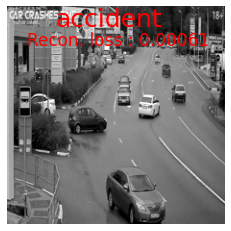

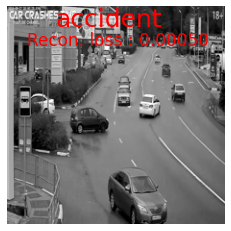

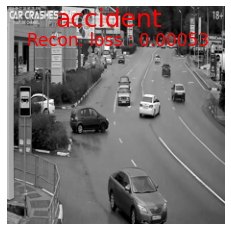

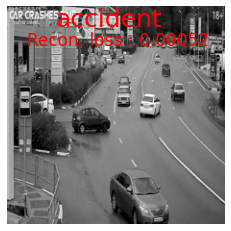

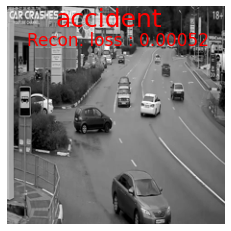

...

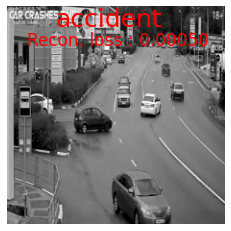

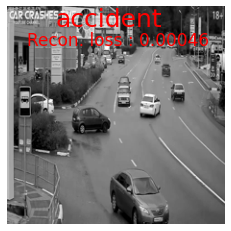

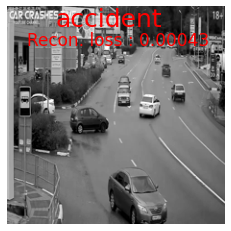

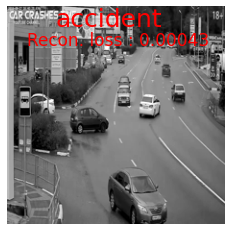

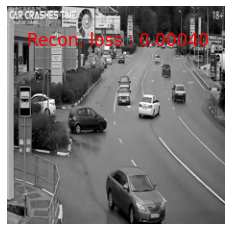

In [ ]:
writing_result(InPut,output,video_name,loss_threshold)

In [ ]:
def videofy(video_name,extension):
  """
  Makes videos from the frames.

  This function saves a video of any format
  of user's choice using the images as the frames.

  Arguments:
  ----------
    video_name: Name with which the video will be saved
          also, it is the folder name containing the frames
          which will be used in forming the video.

    extension:  Format in which the user wants to save the
          video file.
    
  Returns:
  ----------
    None.

  Raises:
  ----------
    FileNotFoundError: In case of path does not exist.
  """
  
  result = '/content/gdrive/MyDrive/accident_detection_autoencoders/result'
  result_video = '/content/gdrive/MyDrive/accident_detection_autoencoders/result_video/'
  video_frame = result + '/' + video_name

  result_video
  img_array = []

  if os.path.exists(video_frame):
    for count in range(len(os.listdir(video_frame))):
      filename = video_frame + '/frame' + f'{count}.jpg' 
      img = cv2.imread(filename)
      height, width, layers = img.shape
      size = (width,height)
      img_array.append(img)
    if os.path.exists(result_video + video_name + '.' + extension):
      os.remove(result_video + video_name + '.' + extension)
    out = cv2.VideoWriter(result_video + video_name + '.' + extension,cv2.VideoWriter_fourcc(*'DIVX'), 24, size)
  else:
    print('not exitst')

  for i in range(len(img_array)):
    out.write(img_array[i])
  out.release()

In [ ]:
videofy(video_name,extension)